# 加载常用的库文件

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import torch
import torchvision
from glob import glob
import torch.nn as nn
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

### 获取数据集

In [2]:
train_path = glob('cityscapes_data/cityscapes_data/train/*')
valid_path = glob('cityscapes_data/cityscapes_data/val/*')

### 数据集可视化

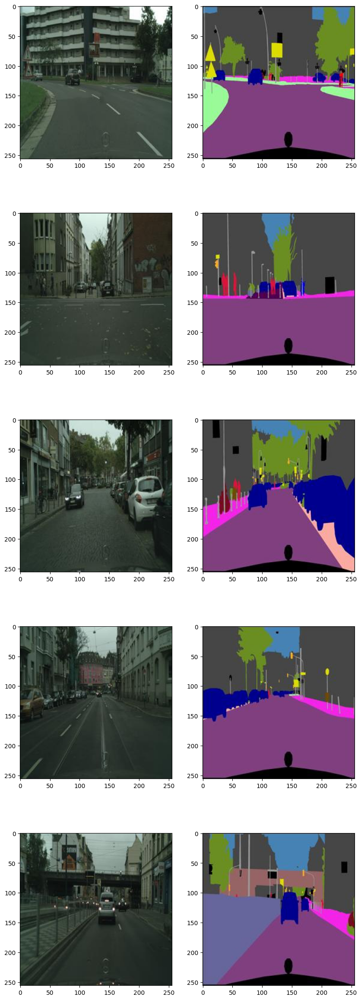

In [3]:
fig,ax = plt.subplots(5,2,figsize=(10,30))
for i in range(5):
    img = plt.imread(train_path[i])
    ax[i][0].imshow(img[:,:256])
    ax[i][1].imshow(img[:,256:])

### 定义数据集

In [4]:
train_dataset = []
validation_dataset = []

In [5]:
class MyDataset(Dataset):
    
    def __init__(self, images_path ,transform_img=None ,transform_label=None):
        
        self.images_path = images_path
        self.transform_img = transform_img
        self.transform_label = transform_label

    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, idx):
        
        img = plt.imread(self.images_path[idx])
        image,label = img[:,:int(img.shape[1]/2)],img[:,int(img.shape[1]/2):]
    
        if self.transform_img:
            image = self.transform_img(image)
            
        if self.transform_label:
            label = self.transform_label(label)
            
        return image, label

### 定义数据变换

In [6]:
mytransformsImage = transform.Compose(
    [
        transform.ToTensor(),
        #transform.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        transform.RandomHorizontalFlip(p=0.9)
    ]
)

mytransformsLabel = transform.Compose(
    [
        transform.ToTensor(),
    ]
)

In [7]:
# train dataset
traindata = MyDataset(train_path, mytransformsImage, mytransformsLabel)
# val dataset
valdata = MyDataset(valid_path, mytransformsImage, mytransformsLabel)

In [8]:
# Creating the DataLoaders
batch_size = 4
train_loader = DataLoader(traindata,batch_size)
vaild_loader = DataLoader(valdata,1)

In [9]:

def show(img,output,label,denorm = False):
    img,output,label = img.cpu(),output.cpu(),label.cpu()
    fig,ax = plt.subplots(len(output),3,figsize=(10,10))
    
    for i in range(len(output)):
        if(len(output) == 3):
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[i][0].imshow(Img.permute(1,2,0))
            ax[i][1].imshow(Lab)
            ax[i][2].imshow(act.permute(1,2,0))
        else:
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[0].imshow(Img.permute(1,2,0))
            ax[1].imshow(Lab)
            ax[2].imshow(act.permute(1,2,0))
    plt.show()

In [10]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# 构建UNet模型


<br>

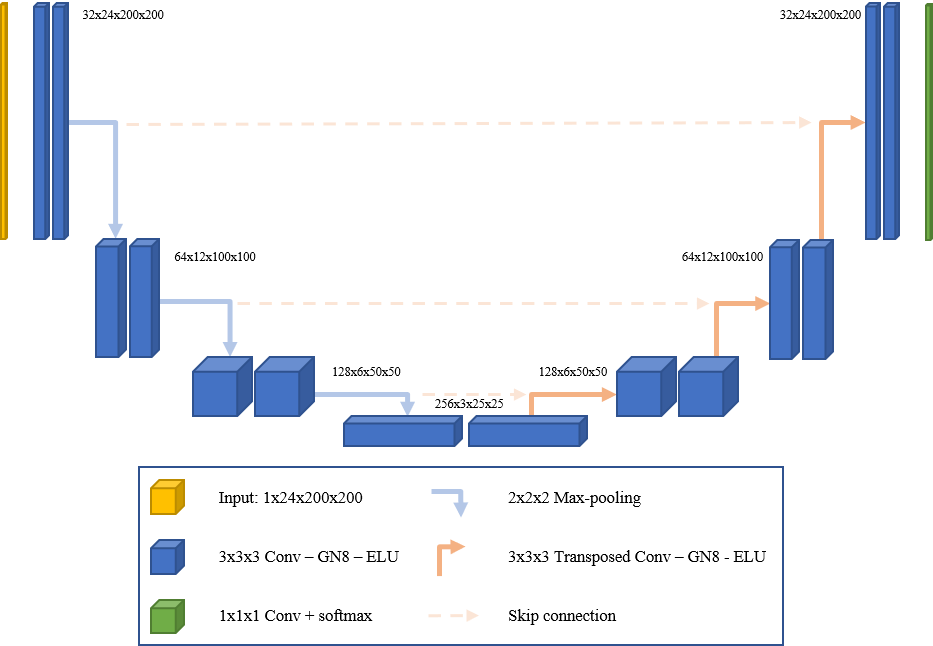

In [11]:
'''

    This Module representes the individual horizontal conv block layers in the Unet Model.
    Conv() -> BatchNorm() -> ReLU() -> Conv() -> ReLU()

'''

class Convblock(nn.Module):
    
      def __init__(self,input_channel,output_channel,kernal=3,stride=1,padding=1):
            
        super().__init__()
        self.convblock = nn.Sequential(
            nn.Conv2d(input_channel,output_channel,kernal,stride,padding),
            nn.BatchNorm2d(output_channel),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_channel,output_channel,kernal),
            nn.ReLU(inplace=True),
        )
    

      def forward(self,x):
        x = self.convblock(x)
        return x

In [12]:
# Encoder -> BottelNeck => Decoder
class UNet(nn.Module):
    
    def __init__(self,input_channel,retain=True):

        super().__init__()

        self.conv1 = Convblock(input_channel,32)
        self.conv2 = Convblock(32,64)
        self.conv3 = Convblock(64,128)
        self.conv4 = Convblock(128,256)
        self.neck = nn.Conv2d(256,512,3,1)
        self.upconv4 = nn.ConvTranspose2d(512,256,3,2,0,1)
        self.dconv4 = Convblock(512,256)
        self.upconv3 = nn.ConvTranspose2d(256,128,3,2,0,1)
        self.dconv3 = Convblock(256,128)
        self.upconv2 = nn.ConvTranspose2d(128,64,3,2,0,1)
        self.dconv2 = Convblock(128,64)
        self.upconv1 = nn.ConvTranspose2d(64,32,3,2,0,1)
        self.dconv1 = Convblock(64,32)
        self.out = nn.Conv2d(32,3,1,1)
        self.retain = retain
        
    def forward(self,x):
        
        # Encoder Network
        
        # Conv down 1
        conv1 = self.conv1(x)
        pool1 = F.max_pool2d(conv1,kernel_size=2,stride=2)
        # Conv down 2
        conv2 = self.conv2(pool1)
        pool2 = F.max_pool2d(conv2,kernel_size=2,stride=2)
        # Conv down 3
        conv3 = self.conv3(pool2)
        pool3 = F.max_pool2d(conv3,kernel_size=2,stride=2)
        # Conv down 4
        conv4 = self.conv4(pool3)
        pool4 = F.max_pool2d(conv4,kernel_size=2,stride=2)

        # BottelNeck
        neck = self.neck(pool4)
        
        # Decoder Network
        
        # Upconv 1
        upconv4 = self.upconv4(neck)
        croped = self.crop(conv4,upconv4)
        # Making the skip connection 1
        dconv4 = self.dconv4(torch.cat([upconv4,croped],1))
        # Upconv 2
        upconv3 = self.upconv3(dconv4)
        croped = self.crop(conv3,upconv3)
        # Making the skip connection 2
        dconv3 = self.dconv3(torch.cat([upconv3,croped],1))
        # Upconv 3
        upconv2 = self.upconv2(dconv3)
        croped = self.crop(conv2,upconv2)
        # Making the skip connection 3
        dconv2 = self.dconv2(torch.cat([upconv2,croped],1))
        # Upconv 4
        upconv1 = self.upconv1(dconv2)
        croped = self.crop(conv1,upconv1)
        # Making the skip connection 4
        dconv1 = self.dconv1(torch.cat([upconv1,croped],1))
        # Output Layer
        out = self.out(dconv1)
        
        if self.retain == True:
            out = F.interpolate(out,list(x.shape)[2:])

        return out
    
    def crop(self,input_tensor,target_tensor):
        # For making the size of the encoder conv layer and the decoder Conv layer same
        _,_,H,W = target_tensor.shape
        return transform.CenterCrop([H,W])(input_tensor)

### 创建训练循环

In [13]:
lr = 0.005
epochs = 5

# 初始化模型（修正参数名）
model = UNet(input_channel=3)  
model.to(device)
# 初始化loss函数
criterion = nn.CrossEntropyLoss()
# 初始化优化器
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

train_acc = []
val_acc = []
train_loss = []
val_loss = []

for epoch in range(epochs):
    model.train()
    running_loss = 0.0  # 需要累加损失
    correct_train = 0
    total_train = 0
    
    # 训练模型
    train_loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train]")
    for img, label in train_loop:
        img = img.to(device)
        label = label.to(device)

        optimizer.zero_grad()
        outputs = model(img)
        
        if label.dim() == 4:
            label = torch.argmax(label, dim=1)
        
        loss = criterion(outputs, label.long())
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()  # 累加损失
        
        predicted = torch.max(outputs, 1)[1]
        correct_train += (predicted == label).sum().item()
        total_train += label.numel()
    
    train_loss.append(running_loss / len(train_loader))  # 正确计算平均损失
    train_acc.append(100 * correct_train / total_train)
    
    # 验证模型
    model.eval()
    val_running_loss = 0.0
    correct_val = 0
    total_val = 0
    
    with torch.no_grad():
        # 修正数据加载器名称
        val_loop = tqdm(vaild_loader, desc=f"Epoch {epoch+1}/{epochs} [Valid]")  # 变量名正确
        for img, label in val_loop:
            img = img.to(device)
            label = label.to(device)
            
            outputs = model(img)
            
            if label.dim() == 4:
                label = torch.argmax(label, dim=1)
            
            loss = criterion(outputs, label.long())
            val_running_loss += loss.item()
            
            _, predicted = torch.max(outputs.data, 1)
            total_val += label.numel()
            correct_val += (predicted == label).sum().item()
            
            val_loop.set_postfix(loss=loss.item())

    val_loss.append(val_running_loss / len(vaild_loader))  # 变量名正确
    val_acc.append(100 * correct_val / total_val)
    
    print(f"Epoch: {epoch+1}/{epochs}, "
          f"Train Loss: {train_loss[-1]:.4f}, "
          f"Train Acc: {train_acc[-1]:.2f}%, "
          f"Val Loss: {val_loss[-1]:.4f}, "
          f"Val Acc: {val_acc[-1]:.2f}%")

Epoch 1/5 [Train]:   0%|          | 0/744 [00:00<?, ?it/s]d:\Anaconda\envs\yolo\Lib\site-packages\torchvision\transforms\functional.py:154: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_numpy.cpp:212.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
Epoch 1/5 [Valid]: 100%|██████████| 500/500 [00:06<00:00, 81.28it/s, loss=1.04] 


Epoch: 1/5, Train Loss: 0.8438, Train Acc: 59.37%, Val Loss: 1.0585, Val Acc: 59.76%


Epoch 2/5 [Valid]: 100%|██████████| 500/500 [00:03<00:00, 140.07it/s, loss=0.853]


Epoch: 2/5, Train Loss: 0.8165, Train Acc: 60.45%, Val Loss: 0.8297, Val Acc: 60.92%


Epoch 3/5 [Valid]: 100%|██████████| 500/500 [00:04<00:00, 110.82it/s, loss=0.865]


Epoch: 3/5, Train Loss: 0.8059, Train Acc: 61.05%, Val Loss: 0.8173, Val Acc: 61.15%


Epoch 4/5 [Valid]: 100%|██████████| 500/500 [00:04<00:00, 102.15it/s, loss=0.871]


Epoch: 4/5, Train Loss: 0.7957, Train Acc: 61.57%, Val Loss: 0.8086, Val Acc: 61.47%


Epoch 5/5 [Valid]: 100%|██████████| 500/500 [00:05<00:00, 92.84it/s, loss=0.882] 

Epoch: 5/5, Train Loss: 0.7870, Train Acc: 61.98%, Val Loss: 0.8232, Val Acc: 61.34%


# 画训练和验证loss的曲线

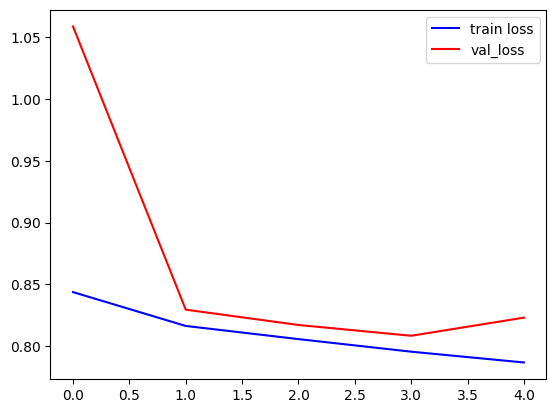

In [14]:
plt.plot(train_loss,color='b',label='train loss')
plt.plot(val_loss,color='r',label = 'val_loss')
plt.legend()

# 可视化结果

In [15]:
def show(img,output,label,denorm = False):
    img,output,label = img.cpu(),output.cpu(),label.cpu()
    fig,ax = plt.subplots(len(output),3,figsize=(15,30))
    cols = ['Input Image','Actual Output','Predicted Output']
    for i in range(len(output)):
        if(len(output) == 3):
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[i][0].imshow(Img.permute(1,2,0))
            ax[i][2].imshow(Lab)
            ax[i][1].imshow(act.permute(1,2,0))
        else:
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[0].imshow(Img.permute(1,2,0))
            ax[2].imshow(Lab)
            ax[1].imshow(act.permute(1,2,0))
            #ax[0].title('this')
            for ax, col in zip(ax, cols):
                ax.set_title(col)
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.0142963..5.489583].


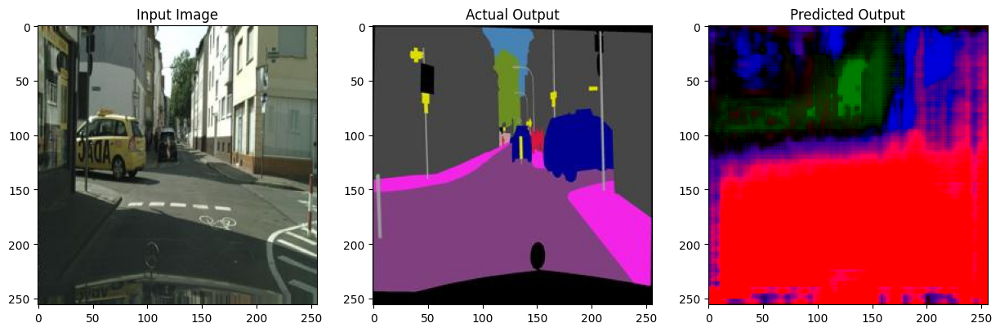

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8172488..5.0966945].


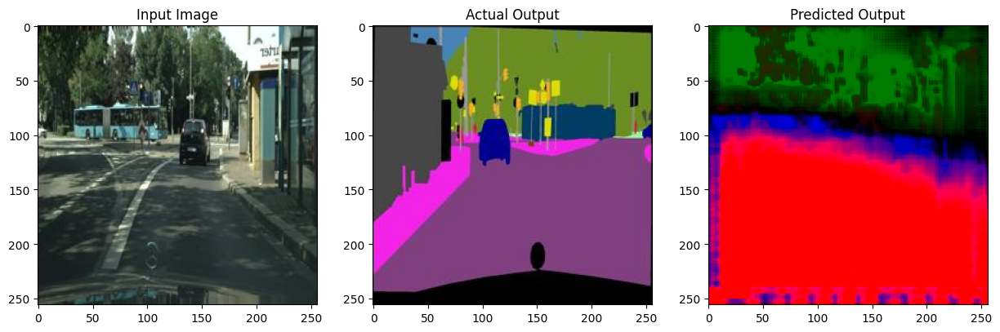

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8140671..5.095441].


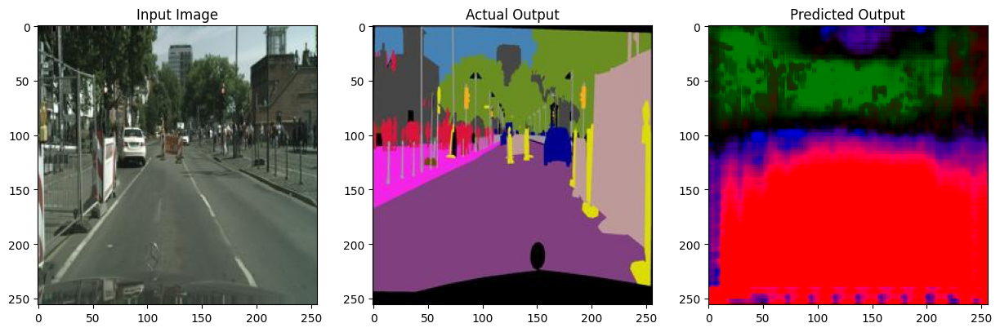

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8577607..5.115165].


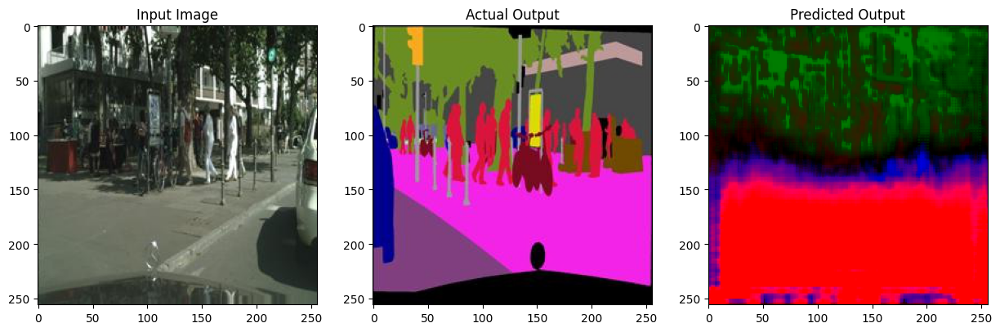

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.0287986..5.538534].


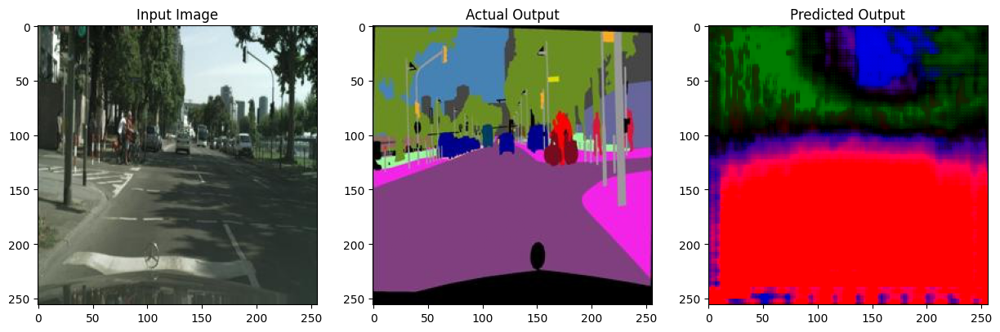

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.929962..5.335997].


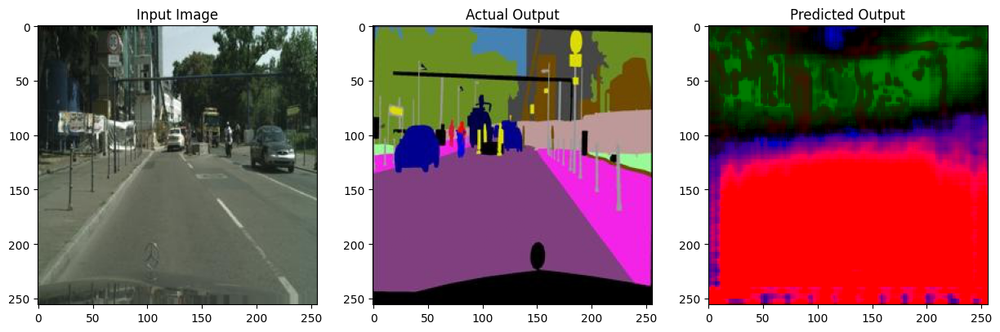

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9228554..5.282531].


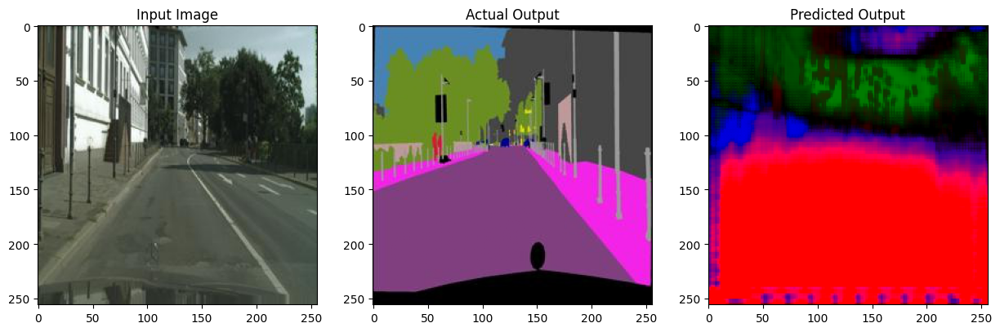

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9824283..5.4439225].


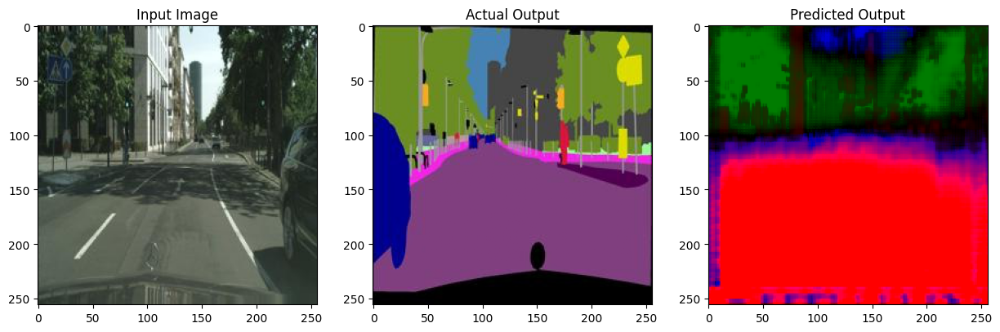

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9348943..5.3118176].


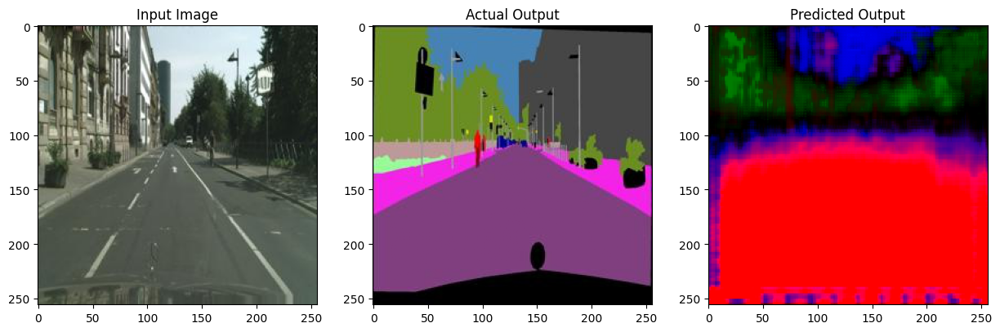

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8033807..5.0678573].


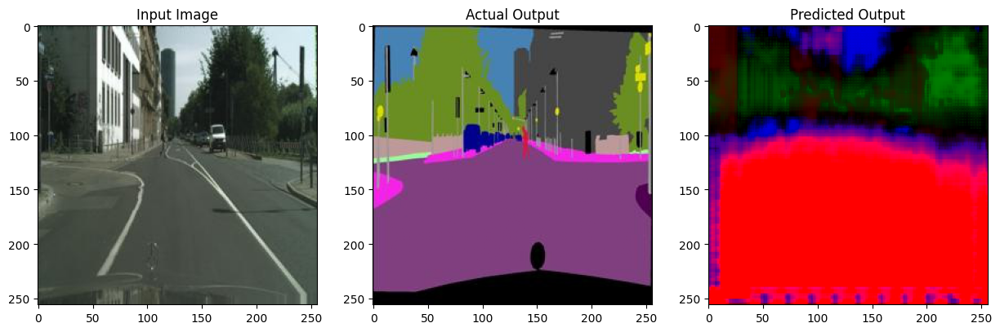

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9838228..5.448112].


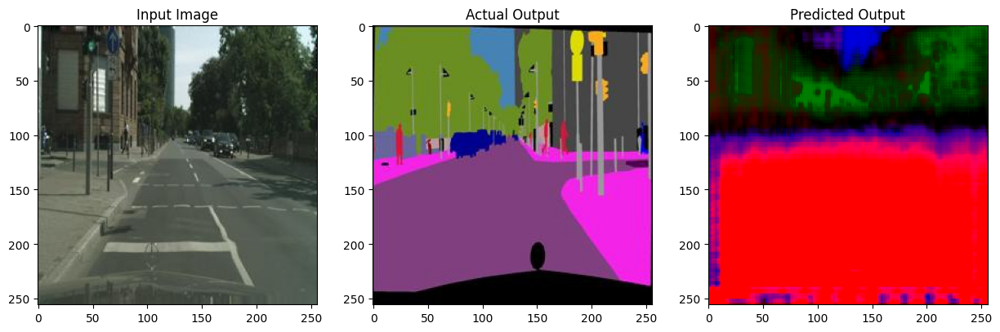

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.769793..5.0025835].


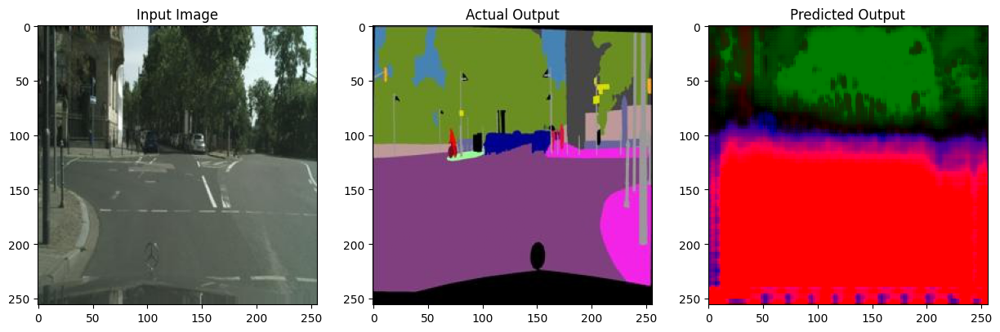

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8794312..5.1988797].


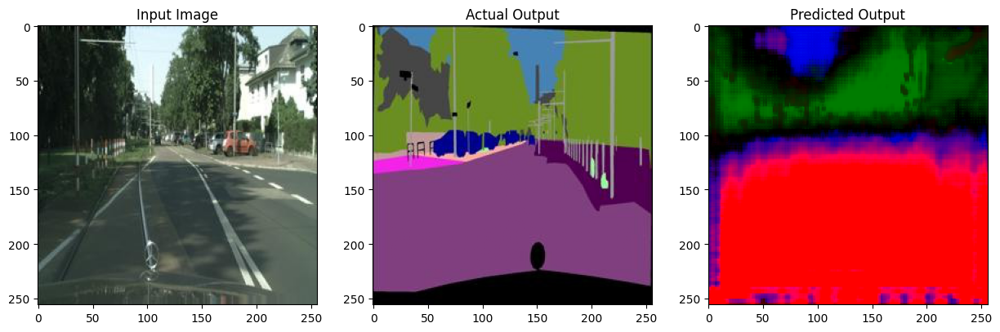

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8133175..5.096988].


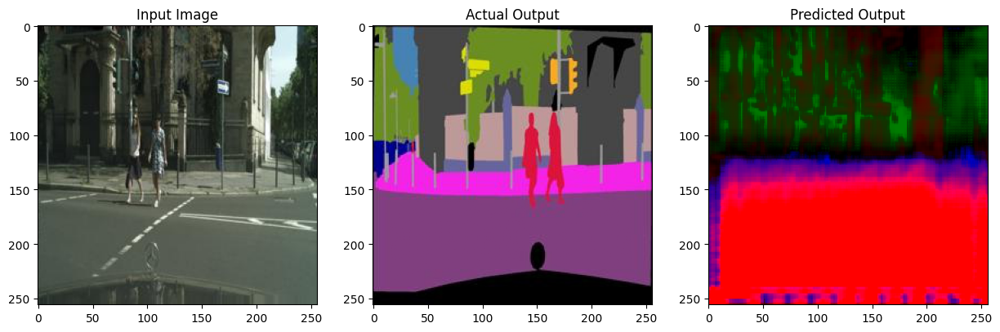

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9071686..5.2462473].


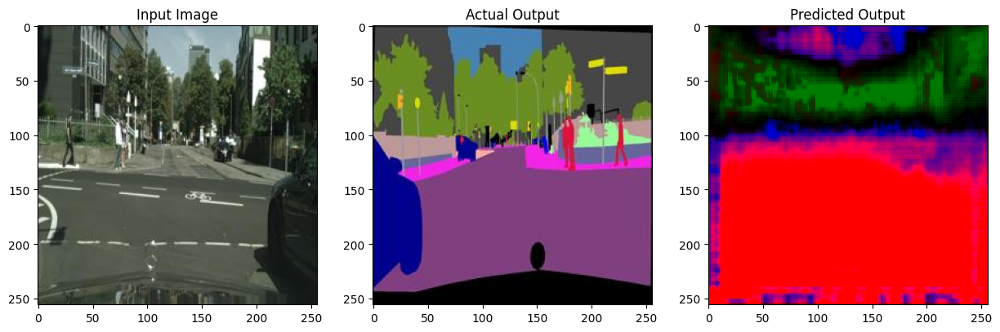

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9068203..5.274556].


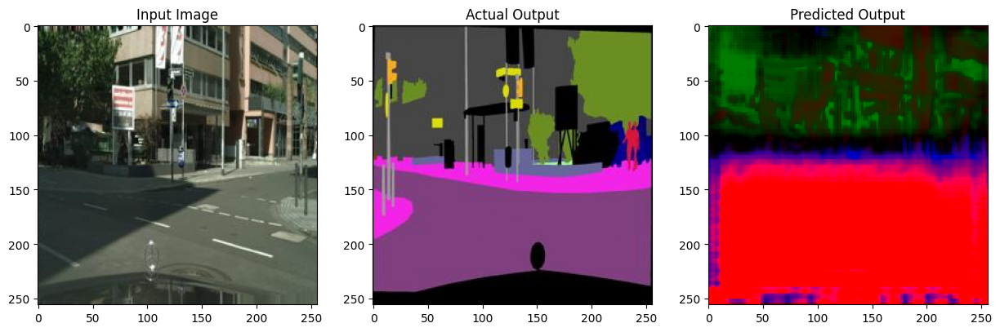

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8031476..5.0641503].


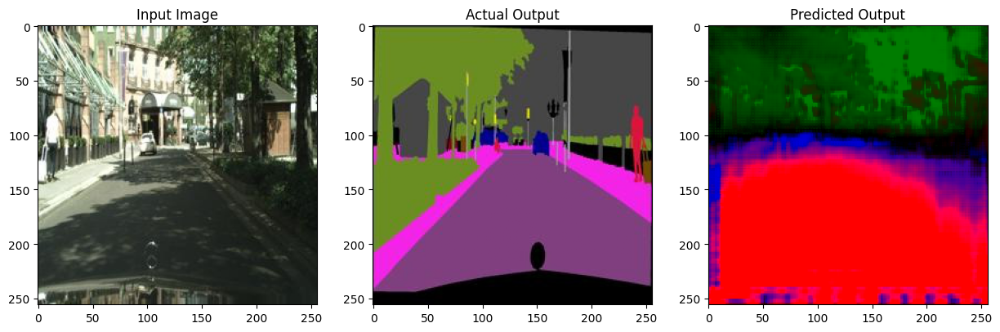

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.7784815..5.0421395].


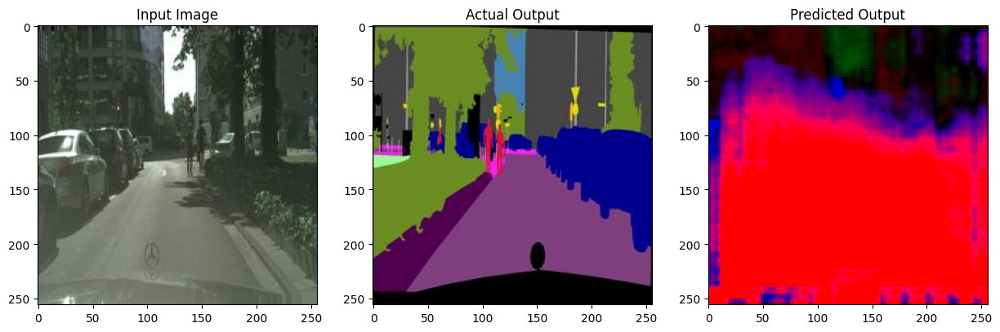

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9538395..5.3821216].


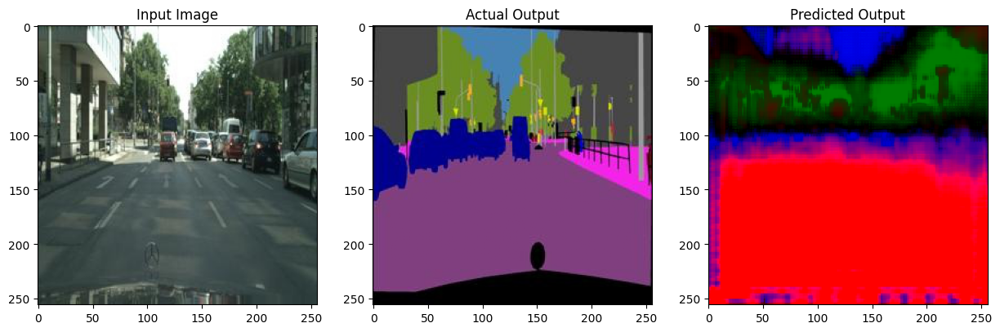

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8525252..5.177821].


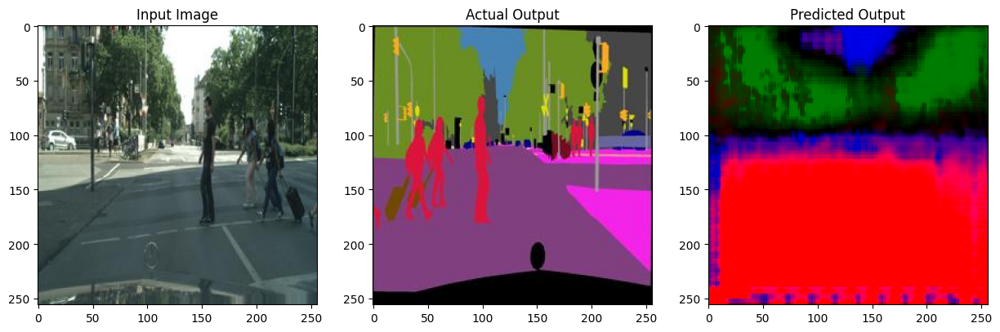

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8611846..5.19404].


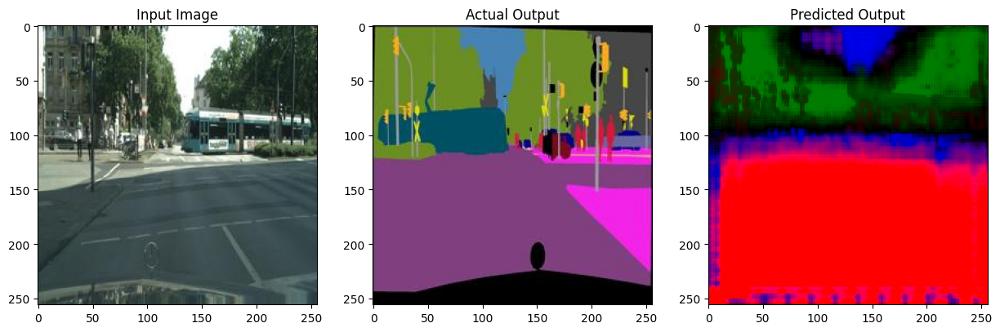

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.8245306..5.1180444].


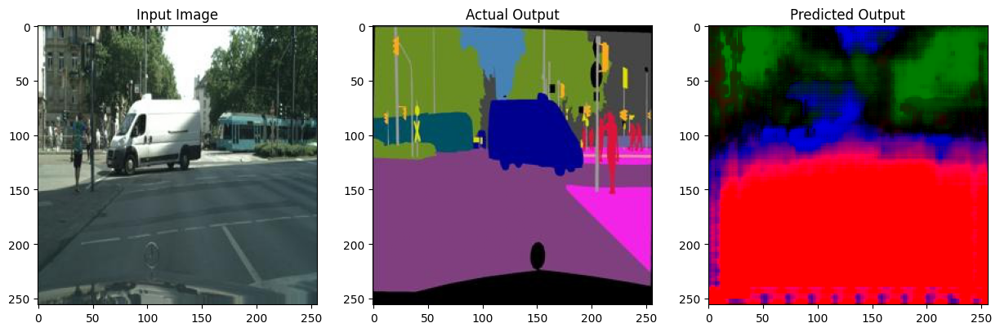

In [16]:
c = 0
for img,label in (vaild_loader):
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        show(img,output,label)
        if c>20:
            break
        c+=1